In [1]:
import os
from os import path, environ
os.chdir('../')
os.getcwd()
# environ["CUDA_VISIBLE_DEVICES"] = "1"

'/wind'

In [2]:
import numpy as np
from common.preprocessing import *
import pandas as pd
from tqdm import tqdm  
import matplotlib.pyplot as plt
from scipy.signal import savgol_filter

In [3]:

ori_data = pd.read_csv('data/wtbdata_245days.csv')
train_data = pd.read_csv('data/train_data.csv')
data = feature_engineering(ori_data)
# calculate the correlation matrix


In [8]:
data = feature_engineering(ori_data)

In [ ]:
corr = data.corr()

### find angle of attack alpha

In [ ]:
# import seaborn as sns
# %matplotlib inline
# alpha 값을 찾기위헤 patv와 rpm과의 상관관계를 여러차례 분석
corr_df = pd.DataFrame([])
for alpha in tqdm(range(15, 45)):
    theta1 = (train_data['Pab1'] + alpha).apply(lambda x:min(x,89)).apply(lambda x:max(x,0))
    theta2 = (train_data['Pab2'] + alpha).apply(lambda x:min(x,89)).apply(lambda x:max(x,0))
    theta3 = (train_data['Pab3'] + alpha).apply(lambda x:min(x,89)).apply(lambda x:max(x,0))
    train_data['Bspd1'] = 1 / np.tan(np.radians(theta1))*train_data['Wspd'] * np.cos(np.radians(train_data['Wdir']))
    train_data['Bspd2'] = 1 / np.tan(np.radians(theta2))*train_data['Wspd'] * np.cos(np.radians(train_data['Wdir']))
    train_data['Bspd3'] = 1 / np.tan(np.radians(theta3))*train_data['Wspd'] * np.cos(np.radians(train_data['Wdir']))
    train_data['RPM'] = ((train_data['Bspd1']+train_data['Bspd2']+train_data['Bspd3'])/3)

    # calculate the correlation matrix
    corr = train_data[['Patv','Bspd1','Bspd2','Bspd3','RPM']].corr()
    corr_df[f'alpha{alpha}'] = corr['Patv']


In [ ]:
# alpha가 20일때 patv와 rpm과의 상관계수가 가장 높다.
corr_df.transpose()

In [ ]:
# patv, RPM plot
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
day1_t1 = data[(data['TurbID']==1) & (data['Day'].isin([1,2,3,4,5]))][['Patv', 'RPM']]
# day1_t1.RPM = day1_t1.RPM[day1_t1.RPM> 3.5] = 3.5
day1_t1 = scaler.fit(day1_t1).transform(day1_t1)
rpm = day1_t1[:,1]
patv = day1_t1[:,0]
plt.plot(range(len(rpm)), rpm)
plt.plot(range(len(rpm)), patv)
plt.show()

In [ ]:
data = preprocess(ori_data)

In [ ]:
idxs_unknown1 = data.query("Wspd > 2.5 and Patv <= 0").index
idxs_unknown2 = data.query("Pab1 > 89 or Pab2 > 89 or Pab3 > 89").index
idxs_unknown  = idxs_unknown1 | idxs_unknown2
data = data.drop(index=idxs_unknown)
idxs_abnormal1 = data.query("Ndir < -720 or Ndir > 720").index
idxs_abnormal2 = data.query("Wdir < -180 or Wdir > 180").index
idxs_abnormal  = idxs_abnormal1 | idxs_abnormal2
data = data.drop(index=idxs_abnormal)

In [ ]:
data

In [ ]:
# patv, Wspd_cube plot
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
day1_t1 = data[(data['TurbID']==1) & (data['Day'].isin([1,2,3,4,5]))][['Patv', 'Wspd_cube']]
# day1_t1.RPM = day1_t1.RPM[day1_t1.RPM> 3.5] = 3.5
day1_t1 = scaler.fit(day1_t1).transform(day1_t1)
Wspd_cube = day1_t1[:,1]
patv = day1_t1[:,0]
plt.plot(range(len(Wspd_cube)), Wspd_cube)
plt.plot(range(len(Wspd_cube)), patv)
plt.show()

In [ ]:
# calculate the correlation matrix
corr = data.corr()

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
# %matplotlib inline
f, ax = plt.subplots(figsize=(30,30))

# plot the heatmap
sns.heatmap(corr, 
        xticklabels=corr.columns,
        yticklabels=corr.columns,annot=True)

In [ ]:
['RPM','Wspd','Wspd_cos','Wspd_cube','P_max','avg3','avg5','Prtv']

In [141]:
abs(corr['Pmax']).sort_values(ascending=True)

TimeX        0.000664
C            0.006411
Tmstamp      0.012771
Wdir         0.016710
DayY         0.017005
WspdY        0.017851
TimeY        0.029645
NdirX        0.035775
Etmp         0.040876
Etmp_abs     0.040876
locY         0.042673
Ndir         0.044597
NdirY        0.044631
Wdir_adj     0.046769
DayX         0.047182
TurbID       0.058697
Day          0.061514
locX         0.062449
Ndir_sin     0.063432
Wdir_sin     0.076128
WdirY        0.076128
Itmp         0.098421
Wdir_cos     0.098868
WdirX        0.098868
Ndir_cos     0.101547
WspdY_abs    0.113532
WspdX_abs    0.194478
TSR3         0.213081
TSR1         0.213146
TSR          0.213309
TSR2         0.213437
Prtv         0.266904
Pab1         0.276259
Pab3         0.276274
Pab          0.276510
Pab2         0.276630
Patan        0.408034
Bspd1        0.702458
Bspd3        0.702586
RPM          0.702709
Bspd2        0.702735
P_max        0.745390
Wspd_cube    0.769996
Papt         0.794927
Patv         0.796047
Wspd      

In [140]:
abs(corr['Patv']).sort_values(ascending=True)

C            0.004642
locY         0.005887
Wdir         0.019012
DayX         0.021636
NdirX        0.024004
Tmstamp      0.026767
Day          0.028634
DayY         0.029076
TimeY        0.032526
Ndir         0.035424
NdirY        0.035462
Etmp_abs     0.036519
Etmp         0.036519
Wdir_adj     0.038159
locX         0.042747
WspdY        0.050459
Ndir_sin     0.052728
TurbID       0.062021
WdirY        0.066515
Wdir_sin     0.066515
TimeX        0.072986
WdirX        0.081415
Wdir_cos     0.081415
Ndir_cos     0.083414
WspdY_abs    0.084859
Itmp         0.127439
WspdX_abs    0.147027
Prtv         0.226269
TSR3         0.466938
TSR2         0.467220
TSR          0.467463
TSR1         0.467616
Pab3         0.504559
Pab2         0.504801
Pab          0.505081
Pab1         0.505169
P_max        0.586738
Patan        0.596939
Wspd_cube    0.634722
Wspd         0.794845
Pmax         0.796047
WspdX        0.810519
Bspd2        0.909386
Bspd3        0.909471
Bspd1        0.909628
RPM       

In [ ]:
abs(corr['Patv1']).sort_values(ascending=False)[1:16].index

In [ ]:
abs(corr['Patv4']).sort_values(ascending=False)[1:16].index

In [ ]:
corr['Wspd2'].sort_values(ascending=False)

In [ ]:
data['Patv1'] = data['Patv'].shift(-144*1)
data['Patv2'] = data['Patv'].shift(-144*2)
data['Patv3'] = data['Patv'].shift(-144*3)
data['Patv4'] = data['Patv'].shift(-144*4)
data['Patv5'] = data['Patv'].shift(-144*5)
data['Patv6'] = data['Patv'].shift(-144*6)
data['Patv7'] = data['Patv'].shift(-144*7)
data['Patv8'] = data['Patv'].shift(-144*8)

In [ ]:
import numpy as np
## add cyclical encoded time feature
data['Day_cos'] = np.cos(2 * np.pi * (data.Day / 365))
data['Day_sin'] = np.sin(2 * np.pi * (data.Day / 365))

In [ ]:
# patv, Wspd_cube plot
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler


day1_t1 = data[(data['TurbID']==1) & (data['Day'].isin(range(198,202)))][['Wspd']]
#     day2_t1 = data[(data['TurbID']==1) & (data['Day'].isin([day,day+1,day+2,day+3,day+4,day+5,day+6]))][['Wspd']]


patv1 = day1_t1
#     patv2 = day2_t1
plt.plot(range(len(patv1)), patv1)
#     plt.plot(range(len(patv2)), patv2)
plt.title(day)
plt.show()

In [ ]:
data

In [ ]:
ori_data.drop(['locX','locY','Wspd_cube','P_max', 'TSR1','TSR2','TSR3','Pab','Bspd1','Bspd2','Bspd3','NdirX','NdirY','WdirX','WdirY','Etmp_abs','WspdX_abs','WspdY_abs','TimeX','TimeY','DayX','DayY'], axis = 1, inplace = True)

In [ ]:
ori_data.loc[data['Etmp']< -13.970, 'Etmp'] = np.nan

In [ ]:
ori_data.loc[data['Etmp']>60.750, 'Etmp'] = np.nan

In [ ]:
ori_data.loc[data['Itmp']< -5.080, 'Itmp'] = np.nan
ori_data.loc[data['Itmp']>61.960, 'Itmp'] = np.nan

In [ ]:
data = feature_engineering(ori_data)

In [ ]:
index = 4720994
window = 20
data.iloc[index-window//2:index+window//2]

In [ ]:
temp.loc[(data['Etmp']< fence_low['Etmp']) | (data['Etmp']> fence_high['Etmp']),'Etmp'].count()

In [20]:
def drop_outliers(data,columns):
    
    temp = data.copy()
    for column in columns: 
        temp[f'{column}_diff'] = temp[column].diff(1)
        temp[f'{column}_diff'] = temp[column].diff(1)
        
    q1 = pd.DataFrame(temp).quantile(0.25)
    q3 = pd.DataFrame(temp).quantile(0.75)
    iqr = q3 - q1 #Interquartile range
    fence_low = q1 - (1.5*iqr)
    fence_high = q3 + (1.5*iqr)
    
    for column in columns:
        print(f"      {column} Fence High/Low ({fence_high[column]}/{fence_low[column]}), Count: {temp.loc[(temp[column]< fence_low[column]) | (temp[column]> fence_high[column]), column].count()}")
        temp.loc[temp[column] > fence_high[column],column] =  np.nan
        temp.loc[temp[column] < fence_low[column],column] =  np.nan
        print(f"      {f'{column}_diff'} Fence High/Low ({fence_high[f'{column}_diff']}/{fence_low[f'{column}_diff']}), Count: {temp.loc[(temp[f'{column}_diff']< fence_low[f'{column}_diff']) | (temp[f'{column}_diff']> fence_high[f'{column}_diff']), f'{column}_diff'].count()}")
        temp.loc[temp[f'{column}_diff'] > fence_high[f'{column}_diff'],column] =  np.nan
        temp.loc[temp[f'{column}_diff'] < fence_low[f'{column}_diff'],column] =  np.nan
        temp.drop([f'{column}_diff'],axis= 1, inplace = True )
    return temp

def fill_gaps(data,columns):
    temp = data.copy()
    for column in columns: 
        temp[column] = temp[column].interpolate()
        temp[column] = temp[column].fillna(method = 'bfill')
    return temp

def curve_fit(data,columns, window_length=21, polyorder=3):
    temp = data.copy()
    for column in columns: 
        temp[column] = savgol_filter(temp[column], window_length, polyorder)
    return temp

In [33]:
def outlier_handler(ori_data, columns,window_length= 21,polyorder= 3):
    window_size = 2
    data = ori_data.copy()
    for i in data['Day'].unique():
        temp = data[(data['Day'] >= i)&(data['Day'] <= i+window_size-1)].copy()
        print('Day ',i )
        temp = drop_outliers(temp, columns)
        temp = fill_gaps(temp, columns)
        temp = curve_fit(temp, columns, window_length = window_length, polyorder = polyorder)

        data[(data['Day'] >= i)&(data['Day'] <= i+window_size-1)] = temp
    return data

def outlier_handler2(ori_data, columns):
    window_size = 2
    data = ori_data.copy()
#     for i in data['Day'].unique():
    i = 1
    temp = data[(data['Day'] >= i)&(data['Day'] <= i+window_size-1)].copy()
    print('Day ',i )
#         temp = drop_outliers(temp, columns)
    temp = fill_gaps(temp, columns)
    temp = curve_fit(temp, columns, window_length = 11, polyorder = 3)

    data[(data['Day'] >= i)&(data['Day'] <= i+window_size-1)] = temp
    return data

In [121]:
data = train_data.copy()

In [9]:
data = outlier_handler(data, ['Etmp','Itmp'])

Day  1
      Etmp Fence High/Low (44.85/16.770000000000003), Count: 2821
      Etmp_diff Fence High/Low (0.6149999999999967/-0.6249999999999982), Count: 2212
      Itmp Fence High/Low (51.25000000000001/19.96999999999999), Count: 322
      Itmp_diff Fence High/Low (0.6950000000000038/-0.7050000000000018), Count: 2894
Day  2
      Etmp Fence High/Low (39.202628309904085/14.414423014057549), Count: 1551
      Etmp_diff Fence High/Low (0.5400527133050028/-0.5441349297155886), Count: 911
      Itmp Fence High/Low (47.405/18.884999999999994), Count: 408
      Itmp_diff Fence High/Low (0.5699999999999896/-0.5499999999999865), Count: 1199
Day  3
      Etmp Fence High/Low (39.02824942791817/14.152917620136389), Count: 1441
      Etmp_diff Fence High/Low (0.4250000000000007/-0.4150000000000027), Count: 1198
      Itmp Fence High/Low (46.72551855181291/19.436688868912256), Count: 382
      Itmp_diff Fence High/Low (0.4874432003922795/-0.4844659202353636), Count: 1403
Day  4
      Etmp Fence High

Day  26
      Etmp Fence High/Low (37.71064612685368/6.453575264205064), Count: 1501
      Etmp_diff Fence High/Low (0.558732131576611/-0.5045535526276845), Count: 1164
      Itmp Fence High/Low (45.86567137953512/10.645247493734155), Count: 258
      Itmp_diff Fence High/Low (0.6605845456031507/-0.5943075760052383), Count: 1730
Day  27
      Etmp Fence High/Low (40.22368850114319/11.4018987005562), Count: 1598
      Etmp_diff Fence High/Low (0.5827745995423186/-0.5263264138607298), Count: 2004
      Itmp Fence High/Low (48.66003362806659/15.939943953222347), Count: 207
      Itmp_diff Fence High/Low (0.679164759725392/-0.6252745995423261), Count: 2057
Day  28
      Etmp Fence High/Low (39.44461118829619/11.29617651465605), Count: 1538
      Etmp_diff Fence High/Low (0.6480368911036951/-0.6533948185061629), Count: 892
      Itmp Fence High/Low (47.94835730630824/16.670985616215052), Count: 203
      Itmp_diff Fence High/Low (0.7191155790602011/-0.7180377881361721), Count: 1001
Day  29


Day  51
      Etmp Fence High/Low (44.23511645962699/20.674930124223813), Count: 1508
      Etmp_diff Fence High/Low (0.39207114253021036/-0.44334402582540644), Count: 2829
      Itmp Fence High/Low (52.84921624713796/24.14647025171722), Count: 189
      Itmp_diff Fence High/Low (0.4994632641386012/-0.5657721068976649), Count: 3186
Day  52
      Etmp Fence High/Low (42.79083790291686/16.55296928644542), Count: 1536
      Etmp_diff Fence High/Low (0.45499999999999474/-0.46499999999999275), Count: 3152
      Itmp Fence High/Low (49.90340613762741/21.200989770620986), Count: 315
      Itmp_diff Fence High/Low (0.6329528369298085/-0.6282547282163566), Count: 2875
Day  53
      Etmp Fence High/Low (47.3422469216506/15.434651847009636), Count: 1434
      Etmp_diff Fence High/Low (0.5865602865860087/-0.5413889342922271), Count: 1477
      Itmp Fence High/Low (55.89999999999999/18.780000000000012), Count: 148
      Itmp_diff Fence High/Low (0.7212474027982765/-0.675092698318231), Count: 1823
D

Day  76
      Etmp Fence High/Low (43.52000000000001/23.999999999999996), Count: 1886
      Etmp_diff Fence High/Low (0.5701777486179047/-0.5502962476965116), Count: 1650
      Itmp Fence High/Low (50.069779975737205/27.740454971241615), Count: 634
      Itmp_diff Fence High/Low (0.5235749198343154/-0.5259581997238616), Count: 2926
Day  77
      Etmp Fence High/Low (43.408835403726066/18.182604609349177), Count: 1219
      Etmp_diff Fence High/Low (0.4185628473357337/-0.45021453089245433), Count: 3166
      Itmp Fence High/Low (48.56545950473863/23.02072429715683), Count: 399
      Itmp_diff Fence High/Low (0.4908450474011108/-0.5247417456685195), Count: 3605
Day  78
      Etmp Fence High/Low (43.19564583797036/14.910757642689546), Count: 1260
      Etmp_diff Fence High/Low (0.4578220006538283/-0.41869320039229674), Count: 2959
      Itmp Fence High/Low (48.25929061784968/19.80784897025054), Count: 255
      Itmp_diff Fence High/Low (0.5300000000000082/-0.5100000000000122), Count: 2417

Day  101
      Etmp Fence High/Low (50.64115152010535/22.664747466491068), Count: 1318
      Etmp_diff Fence High/Low (0.5975751879699391/-0.5959586466165501), Count: 1040
      Itmp Fence High/Low (53.967456506070846/28.181219651261838), Count: 40
      Itmp_diff Fence High/Low (0.636596308319973/-0.6044655699852015), Count: 1204
Day  102
      Etmp Fence High/Low (46.721945262169356/19.966832842698384), Count: 1499
      Etmp_diff Fence High/Low (0.515365360014826/-0.5063826066717496), Count: 3150
      Itmp Fence High/Low (53.50318731611478/23.418087610331135), Count: 37
      Itmp_diff Fence High/Low (0.5740601503759422/-0.6049656750572012), Count: 3637
Day  103
      Etmp Fence High/Low (42.964999999999996/19.165), Count: 1414
      Etmp_diff Fence High/Low (0.49521902582542676/-0.49165032145580856), Count: 1350
      Itmp Fence High/Low (46.343082592004926/23.13012441487097), Count: 262
      Itmp_diff Fence High/Low (0.5749999999999993/-0.5849999999999973), Count: 1430
Day  104


Day  126
      Etmp Fence High/Low (45.00322981366396/19.642105263157553), Count: 1331
      Etmp_diff Fence High/Low (0.5455786204641733/-0.5176054266099719), Count: 1609
      Itmp Fence High/Low (49.126198648795224/23.54916475972499), Count: 96
      Itmp_diff Fence High/Low (0.5849999999999973/-0.5749999999999993), Count: 2466
Day  127
      Etmp Fence High/Low (39.94499999999999/21.825000000000003), Count: 1890
      Etmp_diff Fence High/Low (0.5042857142856931/-0.487192982456115), Count: 2148
      Itmp Fence High/Low (46.53820509153171/24.14107694508097), Count: 284
      Itmp_diff Fence High/Low (0.6120987250735297/-0.6232592350441237), Count: 2670
Day  128
      Etmp Fence High/Low (39.935/18.534999999999997), Count: 1362
      Etmp_diff Fence High/Low (0.49235575351421046/-0.47141345210852537), Count: 2162
      Itmp Fence High/Low (45.63016876430138/21.93708932657696), Count: 183
      Itmp_diff Fence High/Low (0.5694636727688946/-0.5491061212814854), Count: 2579
Day  129
  

Day  151
      Etmp Fence High/Low (35.56/10.84), Count: 1387
      Etmp_diff Fence High/Low (0.5794231502669662/-0.5642593167701788), Count: 1387
      Itmp Fence High/Low (41.276337725443284/16.500762176019762), Count: 360
      Itmp_diff Fence High/Low (0.5568470088264075/-0.5547450147106776), Count: 2245
Day  152
      Etmp Fence High/Low (33.38669132069218/9.615985207584696), Count: 1673
      Etmp_diff Fence High/Low (0.6533949002942059/-0.6089915004903439), Count: 1776
      Itmp Fence High/Low (40.387083518598445/14.05837243441431), Count: 313
      Itmp_diff Fence High/Low (0.6744826740764811/-0.671950800915317), Count: 2404
Day  153
      Etmp Fence High/Low (30.39078763484758/7.312737618502606), Count: 1599
      Etmp_diff Fence High/Low (0.633102729650207/-0.6551712160836773), Count: 1180
      Itmp Fence High/Low (36.07486719516072/12.595079682903563), Count: 433
      Itmp_diff Fence High/Low (0.684999999999997/-0.7149999999999945), Count: 2111
Day  154
      Etmp Fence H

Day  176
      Etmp Fence High/Low (27.892849242671137/8.016290454397318), Count: 1730
      Etmp_diff Fence High/Low (0.4313683724926334/-0.43439800943869833), Count: 2251
      Itmp Fence High/Low (36.4022343903226/11.662659365806443), Count: 479
      Itmp_diff Fence High/Low (0.46603119744778265/-0.48338532907963927), Count: 2631
Day  177
      Etmp Fence High/Low (28.716957339000004/5.525071101666656), Count: 1416
      Etmp_diff Fence High/Low (0.5863615560640767/-0.6039359267734596), Count: 2096
      Itmp Fence High/Low (36.62392598343586/9.545644409938483), Count: 94
      Itmp_diff Fence High/Low (0.5565094406899824/-0.5707215648298778), Count: 3528
Day  178
      Etmp Fence High/Low (25.321191660600636/3.431285003639619), Count: 1903
      Etmp_diff Fence High/Low (0.6000000000000041/-0.6000000000000059), Count: 999
      Itmp Fence High/Low (33.28342391304258/8.509945652174451), Count: 450
      Itmp_diff Fence High/Low (0.5689547237659376/-0.5748504413206952), Count: 1492


Day  201
      Etmp Fence High/Low (17.35031991334815/0.8600349235175733), Count: 2007
      Etmp_diff Fence High/Low (0.41408532249168095/-0.399558789093414), Count: 1679
      Itmp Fence High/Low (29.5257040699578/3.5904932167370003), Count: 605
      Itmp_diff Fence High/Low (0.40000000000000124/-0.400000000000003), Count: 3001
Day  202
      Etmp Fence High/Low (19.119999999999997/-0.2400000000000002), Count: 1746
      Etmp_diff Fence High/Low (0.45771848543983795/-0.4695308090663981), Count: 1191
      Itmp Fence High/Low (31.411845644180893/4.432892613491466), Count: 430
      Itmp_diff Fence High/Low (0.4255462235769265/-0.43039876752851214), Count: 1923
Day  203
      Etmp Fence High/Low (20.410000000000004/-8.790000000000001), Count: 1315
      Etmp_diff Fence High/Low (0.3658319712324302/-0.42749918273945814), Count: 2541
      Itmp Fence High/Low (31.721614906832563/-0.09602484472094197), Count: 41
      Itmp_diff Fence High/Low (0.39273945733898863/-0.44123242889831893), C

Day  227
      Etmp Fence High/Low (9.71/-16.45), Count: 1770
      Etmp_diff Fence High/Low (0.46293336277617225/-0.40499113894716476), Count: 2814
      Itmp Fence High/Low (25.837095456031484/-8.661825760052473), Count: 200
      Itmp_diff Fence High/Low (0.3413340833462386/-0.35555680557706415), Count: 6008
Day  228
      Etmp Fence High/Low (10.709999999999999/-13.37), Count: 1615
      Etmp_diff Fence High/Low (0.48677590715920094/-0.4680655442955207), Count: 1617
      Itmp Fence High/Low (23.000323751732704/-6.984194251039623), Count: 292
      Itmp_diff Fence High/Low (0.5800000000000011/-0.6200000000000009), Count: 3353
Day  229
      Etmp Fence High/Low (9.185/-11.095), Count: 1853
      Etmp_diff Fence High/Low (0.4629653882305822/-0.46738890930317195), Count: 1564
      Itmp Fence High/Low (21.309070059659618/-6.705442035795772), Count: 587
      Itmp_diff Fence High/Low (0.6400000000000006/-0.6400000000000006), Count: 3501
Day  230
      Etmp Fence High/Low (8.17745739771

In [10]:
data

,TurbID,Day,Tmstamp,Wspd,Wdir,Etmp,Itmp,Ndir,Pab1,Pab2,Pab3,Prtv,Patv,locX,locY,TimeX,TimeY,DayX,DayY,Etmp_abs,Wdir_adj,Wdir_cos,Wdir_sin,Ndir_cos,Ndir_sin,WdirX,WdirY,NdirX,NdirY,WspdX,WspdY,WspdX_abs,WspdY_abs,TSR1,TSR2,TSR3,Bspd1,Bspd2,Bspd3,RPM,Pab,TSR,Wspd_cube,Pmax,Papt,Patan
0,1,1,0.000000,NaN,NaN,30.741720,41.846518,NaN,NaN,NaN,NaN,NaN,NaN,3349.8515,5939.23193,1.000000,0.000000,0.999852,0.017202,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.570796
1,1,1,0.166667,6.17,-3.99,30.699258,41.742740,25.92,1.00,1.00,1.00,-0.25,494.66,3349.8515,5939.23193,0.999048,0.043619,0.999852,0.017202,273.88,0.382751,0.927641,0.373474,0.899405,0.437116,0.927641,0.373474,0.999969,0.007896,6.155045,-0.429323,5.723544,2.304332,1.150368,1.150368,1.150368,7.080570,7.080570,7.080570,7.080570,1.00,1.150368,233.181313,513.725983,494.660063,-0.000505
2,1,1,0.333333,6.27,-2.18,30.640177,41.629790,20.91,1.00,1.00,1.00,-0.24,509.76,3349.8515,5939.23193,0.996195,0.087156,0.999852,0.017202,273.75,0.326900,0.947042,0.321109,0.934142,0.356901,0.947042,0.321109,0.999980,0.006370,6.265462,-0.238505,5.937955,2.013353,1.150368,1.150368,1.150368,7.207590,7.207590,7.207590,7.207590,1.00,1.150368,245.957079,542.129833,509.760056,-0.000471
3,1,1,0.500000,6.42,-0.73,30.567261,41.510058,20.91,1.00,1.00,1.00,-0.26,542.53,3349.8515,5939.23193,0.991445,0.130526,0.999852,0.017202,273.67,0.352207,0.938613,0.344971,0.934142,0.356901,0.938613,0.344971,0.999980,0.006370,6.419479,-0.081794,6.025899,2.214711,1.150368,1.150368,1.150368,7.384766,7.384766,7.384766,7.384766,1.00,1.150368,264.544863,583.270818,542.530062,-0.000479
4,1,1,0.666667,6.25,0.89,30.483295,41.385937,20.91,1.00,1.00,1.00,-0.23,509.36,3349.8515,5939.23193,0.984808,0.173648,0.999852,0.017202,273.64,0.380482,0.928486,0.371368,0.934142,0.356901,0.928486,0.371368,0.999980,0.006370,6.249246,0.097080,5.803036,2.321049,1.150368,1.150368,1.150368,7.188935,7.188935,7.188935,7.188935,1.00,1.150368,244.052275,538.147575,509.360052,-0.000452
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4727515,134,245,23.166667,7.79,2.80,-0.281571,3.767833,216.51,6.03,6.03,6.03,-111.69,601.44,11.3385,6713.46517,0.976296,-0.216440,-0.477413,-0.878679,243.08,3.827682,-0.773730,-0.633516,-0.803753,-0.594963,-0.773730,-0.633516,0.997826,0.065905,7.780700,0.380540,-6.027354,-4.935089,0.964677,0.964677,0.964677,7.505865,7.505865,7.505865,7.505865,6.03,0.964677,471.038039,1169.243221,611.722756,-0.183613
4727516,134,245,23.333333,8.06,4.39,-0.218480,3.912164,216.51,5.81,5.81,5.81,-72.67,673.79,11.3385,6713.46517,0.984808,-0.173648,-0.477413,-0.878679,243.38,3.855432,-0.755853,-0.654741,-0.803753,-0.594963,-0.755853,-0.654741,0.997826,0.065905,8.036353,0.616953,-6.092179,-5.277211,0.972118,0.972118,0.972118,7.812283,7.812283,7.812283,7.812283,5.81,0.972118,519.011538,1286.738318,677.697494,-0.107437
4727517,134,245,23.500000,8.08,2.28,-0.134400,4.081750,216.51,0.68,0.68,0.68,-118.70,999.36,11.3385,6713.46517,0.991445,-0.130526,-0.477413,-0.878679,242.99,3.818606,-0.779447,-0.626468,-0.803753,-0.594963,-0.779447,-0.626468,0.997826,0.065905,8.073603,0.321447,-6.297934,-5.061860,1.163428,1.163428,1.163428,9.393060,9.393060,9.393060,9.393060,0.68,1.163428,526.262273,1306.808481,1006.384668,-0.118222
4727518,134,245,23.666667,8.46,0.80,-0.027092,4.278932,216.51,0.02,0.02,0.02,-58.12,1100.89,11.3385,6713.46517,0.996195,-0.087156,-0.477413,-0.878679,243.01,3.792775,-0.795368,-0.606127,-0.803753,-0.594963,-0.795368,-0.606127,0.997826,0.065905,8.459175,0.118120,-6.728811,-5.127836,1.190909,1.190909,1.190909,10.074109,10.074109,10.074109,10.074109,0.02,1.190909,605.318689,1502.996765,1102.423116,-0.052745


In [33]:
data['Wspd_cube'] = (data['WspdX']) ** 3
data['C'] = (data['Patv']/data['Wspd_cube'] * data['Etmp_abs']/807)
data['Pmax'] = data['Wspd_cube'] / data['Etmp_abs']*data['C']*807
# C = data.groupby(['TurbID']).mean()['C'].to_list()
# for i, c in tqdm(enumerate(C)):
#     cond = data['TurbID'] == (i+1)
#     data.loc[cond,'Pmax'] = data[cond]['Pmax']*c


In [34]:
data

,TurbID,Day,Tmstamp,Wspd,Wdir,Etmp,Itmp,Ndir,Pab1,Pab2,Pab3,Prtv,Patv,locX,locY,TimeX,TimeY,DayX,DayY,Etmp_abs,Wdir_adj,Wdir_cos,Wdir_sin,Ndir_cos,Ndir_sin,WdirX,WdirY,NdirX,NdirY,WspdX,WspdY,WspdX_abs,WspdY_abs,TSR1,TSR2,TSR3,Bspd1,Bspd2,Bspd3,RPM,Pab,TSR,Wspd_cube,Pmax,Papt,Patan,C
0,1,1,0.000000,NaN,NaN,30.741720,41.846518,NaN,NaN,NaN,NaN,NaN,NaN,3349.8515,5939.23193,1.000000,0.000000,0.999852,0.017202,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.570796,NaN
1,1,1,0.166667,6.17,-3.99,30.699258,41.742740,25.92,1.00,1.00,1.00,-0.25,494.66,3349.8515,5939.23193,0.999048,0.043619,0.999852,0.017202,273.88,0.382751,0.927641,0.373474,0.899405,0.437116,0.927641,0.373474,0.999969,0.007896,6.155045,-0.429323,5.723544,2.304332,1.150368,1.150368,1.150368,7.080570,7.080570,7.080570,7.080570,1.00,1.150368,233.181313,343.539724,494.660063,-0.000505,0.500000
2,1,1,0.333333,6.27,-2.18,30.640177,41.629790,20.91,1.00,1.00,1.00,-0.24,509.76,3349.8515,5939.23193,0.996195,0.087156,0.999852,0.017202,273.75,0.326900,0.947042,0.321109,0.934142,0.356901,0.947042,0.321109,0.999980,0.006370,6.265462,-0.238505,5.937955,2.013353,1.150368,1.150368,1.150368,7.207590,7.207590,7.207590,7.207590,1.00,1.150368,245.957079,362.533996,509.760056,-0.000471,0.500000
3,1,1,0.500000,6.42,-0.73,30.567261,41.510058,20.91,1.00,1.00,1.00,-0.26,542.53,3349.8515,5939.23193,0.991445,0.130526,0.999852,0.017202,273.67,0.352207,0.938613,0.344971,0.934142,0.356901,0.938613,0.344971,0.999980,0.006370,6.419479,-0.081794,6.025899,2.214711,1.150368,1.150368,1.150368,7.384766,7.384766,7.384766,7.384766,1.00,1.150368,264.544863,390.045866,542.530062,-0.000479,0.500000
4,1,1,0.666667,6.25,0.89,30.483295,41.385937,20.91,1.00,1.00,1.00,-0.23,509.36,3349.8515,5939.23193,0.984808,0.173648,0.999852,0.017202,273.64,0.380482,0.928486,0.371368,0.934142,0.356901,0.928486,0.371368,0.999980,0.006370,6.249246,0.097080,5.803036,2.321049,1.150368,1.150368,1.150368,7.188935,7.188935,7.188935,7.188935,1.00,1.150368,244.052275,359.870973,509.360052,-0.000452,0.500000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4727515,134,245,23.166667,7.79,2.80,-0.281571,3.767833,216.51,6.03,6.03,6.03,-111.69,601.44,11.3385,6713.46517,0.976296,-0.216440,-0.477413,-0.878679,243.08,3.827682,-0.773730,-0.633516,-0.803753,-0.594963,-0.773730,-0.633516,0.997826,0.065905,7.780700,0.380540,-6.027354,-4.935089,0.964677,0.964677,0.964677,7.505865,7.505865,7.505865,7.505865,6.03,0.964677,471.038039,601.440000,611.722756,-0.183613,0.384602
4727516,134,245,23.333333,8.06,4.39,-0.218480,3.912164,216.51,5.81,5.81,5.81,-72.67,673.79,11.3385,6713.46517,0.984808,-0.173648,-0.477413,-0.878679,243.38,3.855432,-0.755853,-0.654741,-0.803753,-0.594963,-0.755853,-0.654741,0.997826,0.065905,8.036353,0.616953,-6.092179,-5.277211,0.972118,0.972118,0.972118,7.812283,7.812283,7.812283,7.812283,5.81,0.972118,519.011538,673.790000,677.697494,-0.107437,0.391524
4727517,134,245,23.500000,8.08,2.28,-0.134400,4.081750,216.51,0.68,0.68,0.68,-118.70,999.36,11.3385,6713.46517,0.991445,-0.130526,-0.477413,-0.878679,242.99,3.818606,-0.779447,-0.626468,-0.803753,-0.594963,-0.779447,-0.626468,0.997826,0.065905,8.073603,0.321447,-6.297934,-5.061860,1.163428,1.163428,1.163428,9.393060,9.393060,9.393060,9.393060,0.68,1.163428,526.262273,873.891218,1006.384668,-0.118222,0.500000
4727518,134,245,23.666667,8.46,0.80,-0.027092,4.278932,216.51,0.02,0.02,0.02,-58.12,1100.89,11.3385,6713.46517,0.996195,-0.087156,-0.477413,-0.878679,243.01,3.792775,-0.795368,-0.606127,-0.803753,-0.594963,-0.795368,-0.606127,0.997826,0.065905,8.459175,0.118120,-6.728811,-5.127836,1.190909,1.190909,1.190909,10.074109,10.074109,10.074109,10.074109,0.02,1.190909,605.318689,1005.086586,1102.423116,-0.052745,0.500000


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
 

In [50]:
C[1]

TurbID
1      0.387062
2      0.337438
3      0.363491
4      0.376365
5      0.365341
         ...   
130    0.410257
131    0.428879
132    0.356247
133    0.398995
134    0.400031
Name: C, Length: 134, dtype: float64

In [69]:
location_data['x']

TurbID
1      3349.8515
2      3351.0017
3      3314.7797
4      3352.0940
5      3355.3420
         ...    
130      12.6509
131      23.3458
132      62.6774
133      78.4309
134      11.3385
Name: x, Length: 134, dtype: float64

In [74]:
x[1]

3349.8515

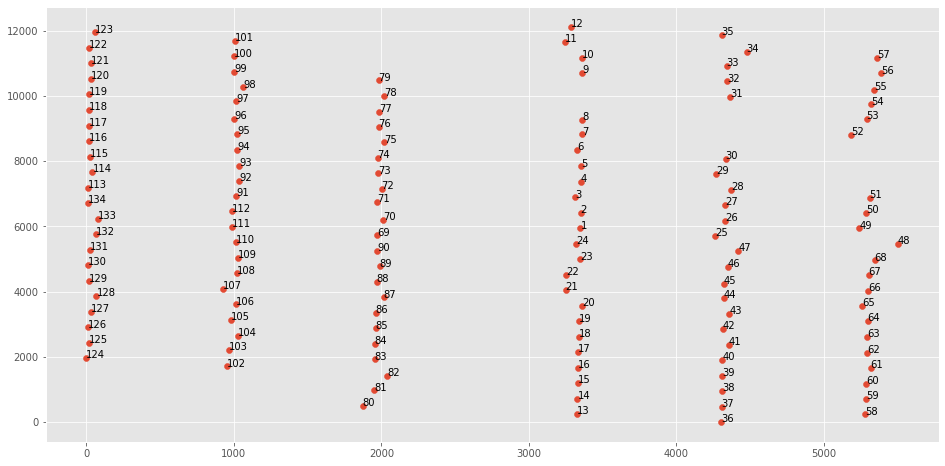

In [75]:
location_data = pd.read_csv(join(PATH.input, "turb_location.csv")).set_index('TurbID')

x= location_data['x']
y = location_data['y']
plt.scatter(x,y)

# Loop for annotation of all points
for i in range(len(x)):
    plt.annotate(location_data.index[i], (x[i+1], y[i+1] + 0.2))
plt.show()

In [55]:
plt.scatter(, C[day])
plt.show()

{1: {'x': 3349.8515, 'y': 5939.23193},
 2: {'x': 3351.0017, 'y': 6416.64673},
 3: {'x': 3314.7797, 'y': 6892.18395},
 4: {'x': 3352.094, 'y': 7366.14203},
 5: {'x': 3355.342, 'y': 7841.20175},
 6: {'x': 3329.4284, 'y': 8340.79769},
 7: {'x': 3360.5473, 'y': 8816.23834},
 8: {'x': 3360.2992, 'y': 9265.21442},
 9: {'x': 3359.9419, 'y': 10696.54549},
 10: {'x': 3361.2616, 'y': 11171.77916},
 11: {'x': 3244.0619, 'y': 11646.05877},
 12: {'x': 3286.7788, 'y': 12121.00426},
 13: {'x': 3326.2552, 'y': 244.02595},
 14: {'x': 3328.7796, 'y': 719.04816},
 15: {'x': 3329.7588, 'y': 1194.28795},
 16: {'x': 3333.9042, 'y': 1658.25733},
 17: {'x': 3334.2558, 'y': 2140.55426},
 18: {'x': 3336.8477, 'y': 2615.58831},
 19: {'x': 3338.8861, 'y': 3090.44941},
 20: {'x': 3361.0339, 'y': 3566.91886},
 21: {'x': 3249.0218, 'y': 4043.58605},
 22: {'x': 3250.8602, 'y': 4519.34673},
 23: {'x': 3346.8376, 'y': 4989.86182},
 24: {'x': 3322.2136, 'y': 5465.8856},
 25: {'x': 4260.8151, 'y': 5699.75016},
 26: {'x':

In [85]:
i, C[day][i]

(134, 0.4000309523685679)

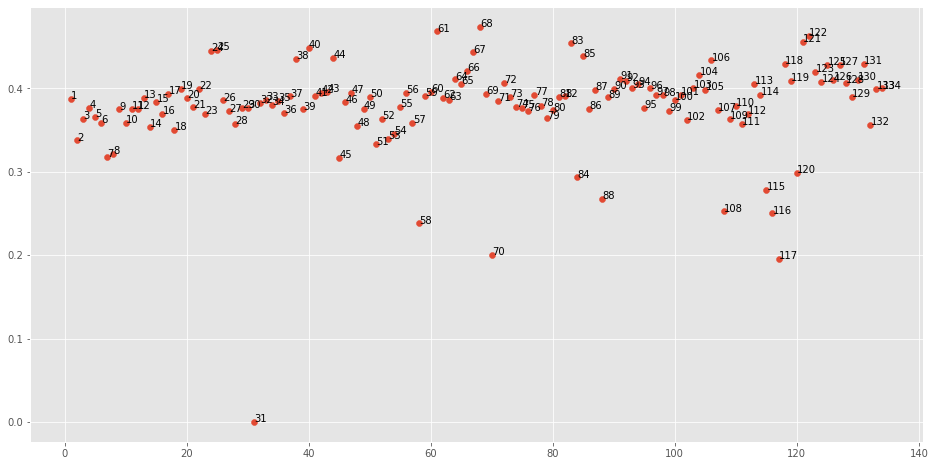

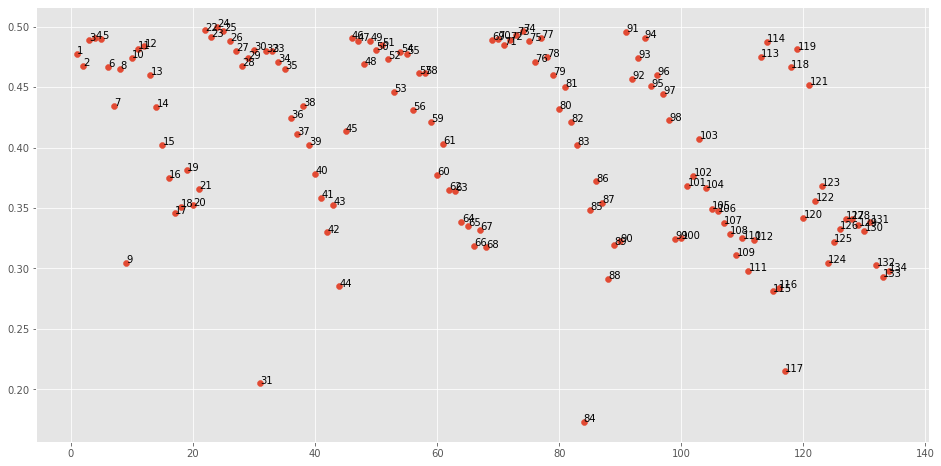

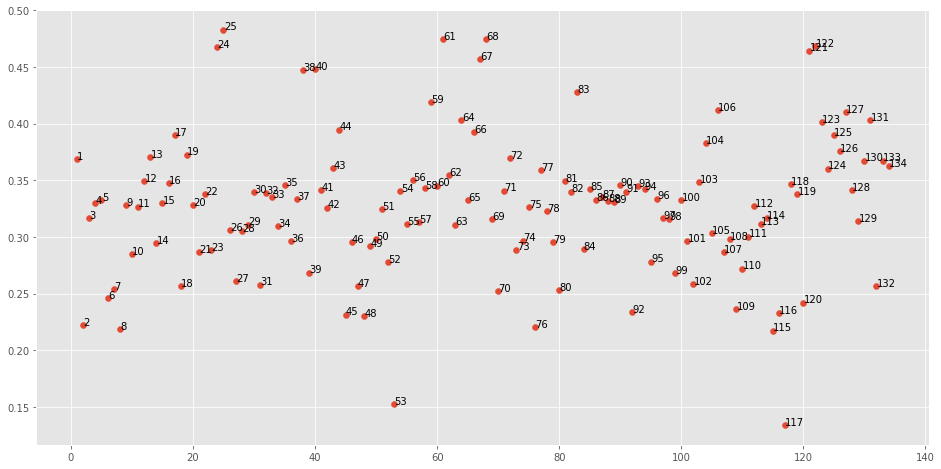

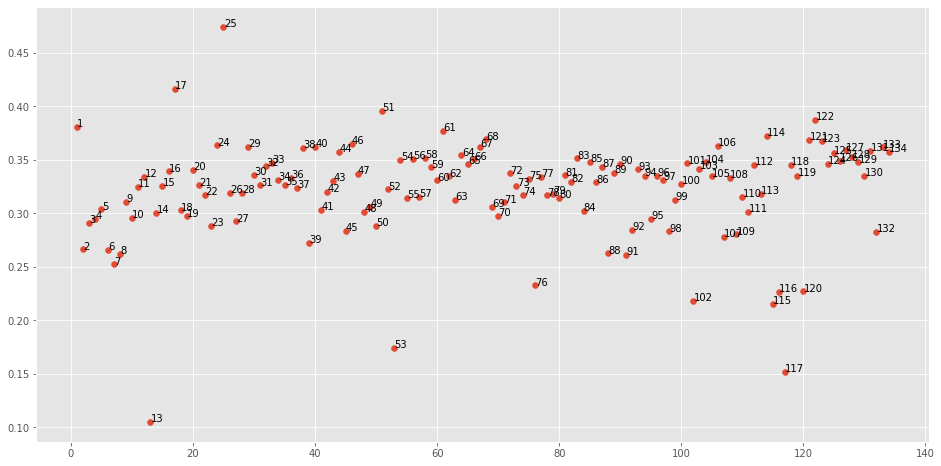

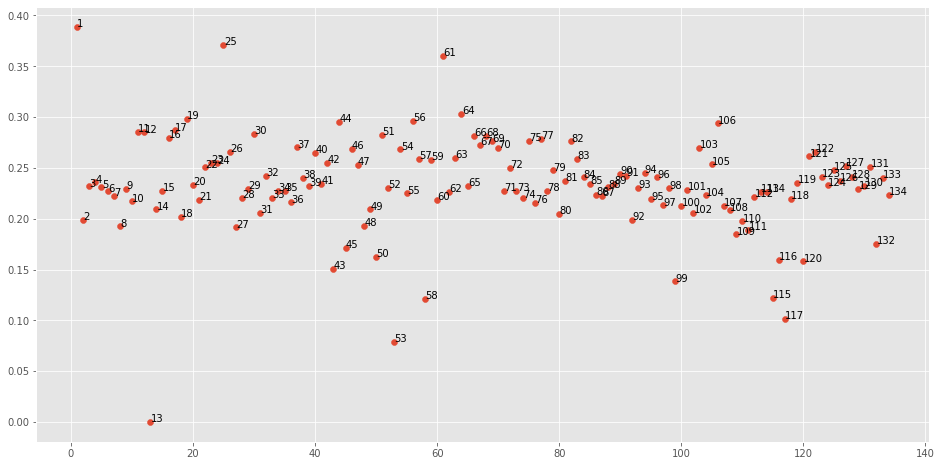

...

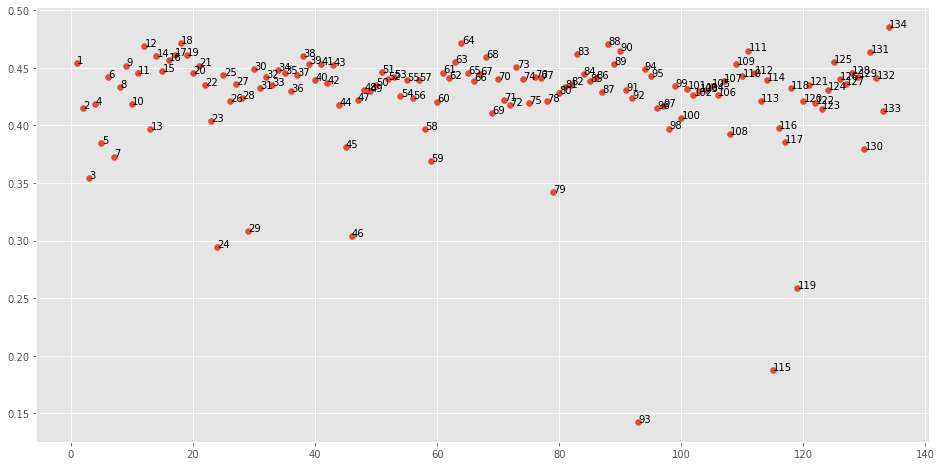

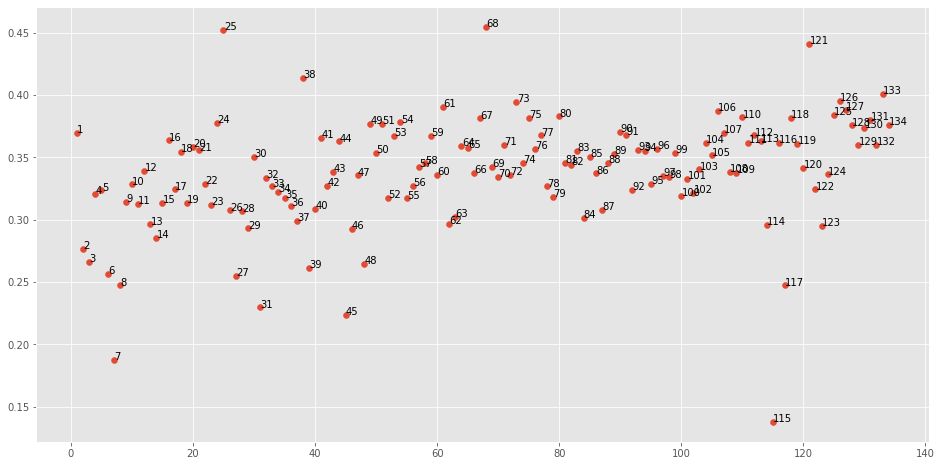

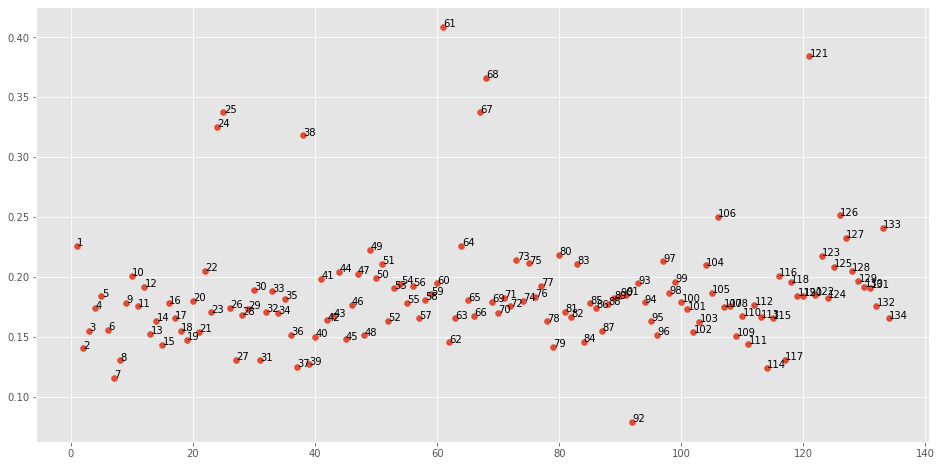

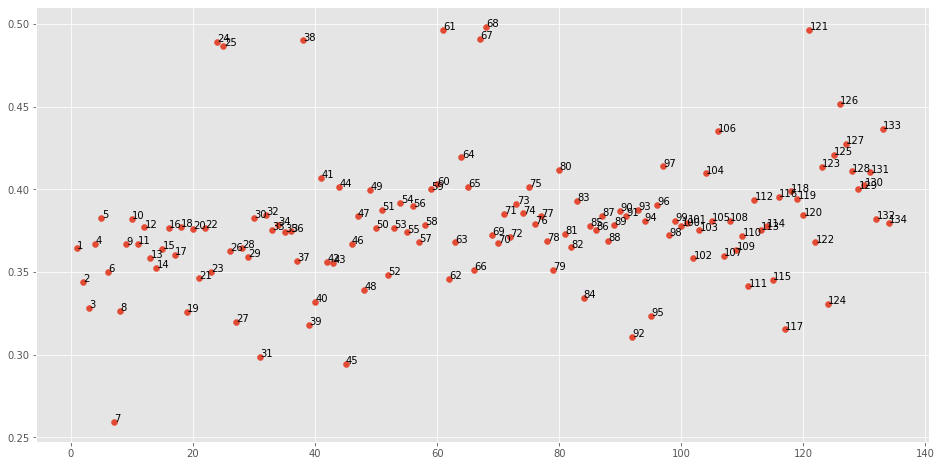

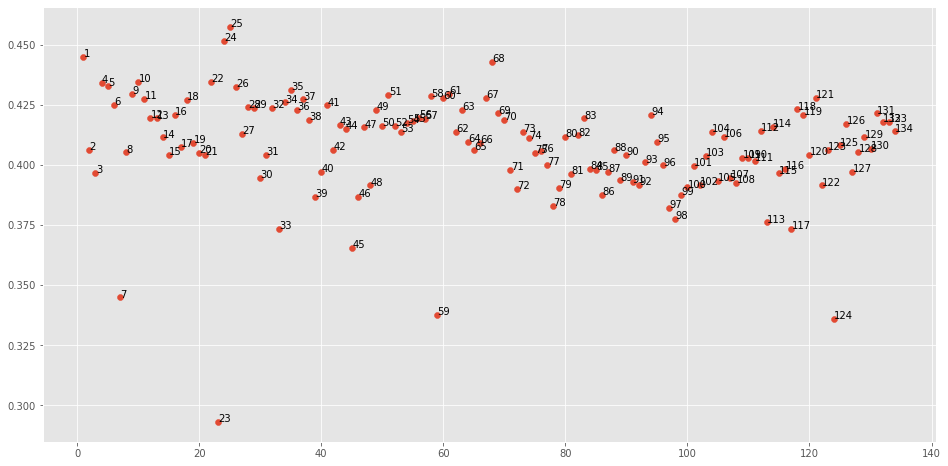

In [ ]:

C = data.groupby(['Day','TurbID']).mean()['C']
for day in range(1,201):
    x= list(range(1,135))
    plt.scatter(x, C[day])
    for i in x:
        plt.annotate(i, (i+0.05, C[day][i]))
    plt.show()

In [16]:
def reject_outliers(data, m = 2.):
    d = np.abs(data - np.median(data))
    mdev = np.median(d)
    s = d/mdev if mdev else 0.
    return data[s<m]

In [17]:
C = reject_outliers(C)

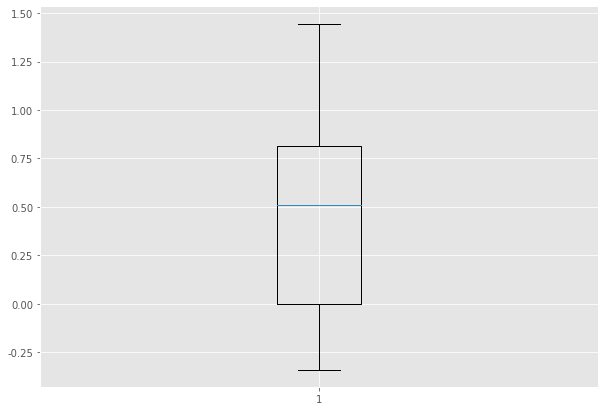

In [19]:
import matplotlib.pyplot as plt
import numpy as np
 
 
 
fig = plt.figure(figsize =(10, 7))
 
# Creating plot
plt.boxplot(C)
 
# show plot
plt.show()

<AxesSubplot:title={'center':'C'}, xlabel='[TurbID]'>

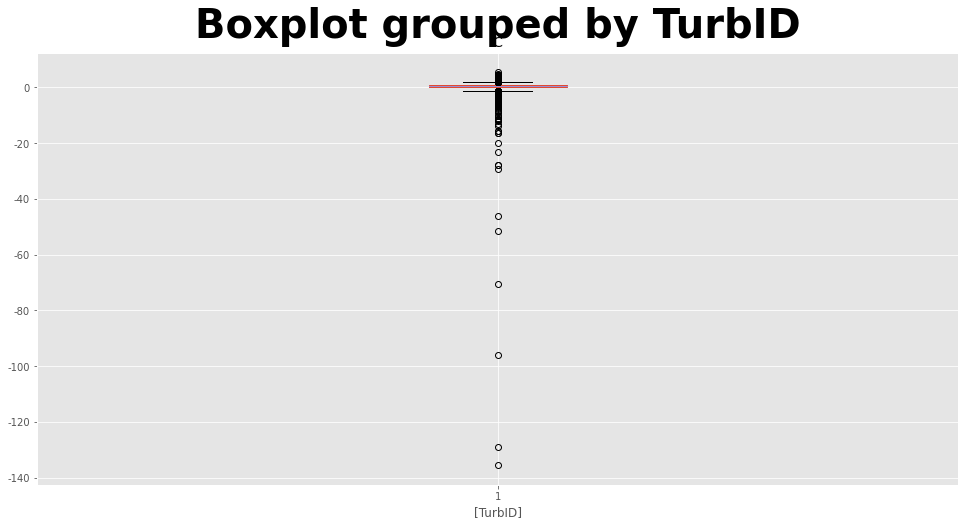

In [25]:
data[data['TurbID']== 1].boxplot(column=['C'], by=['TurbID'])

In [8]:
corr = data.corr()

<AxesSubplot:>

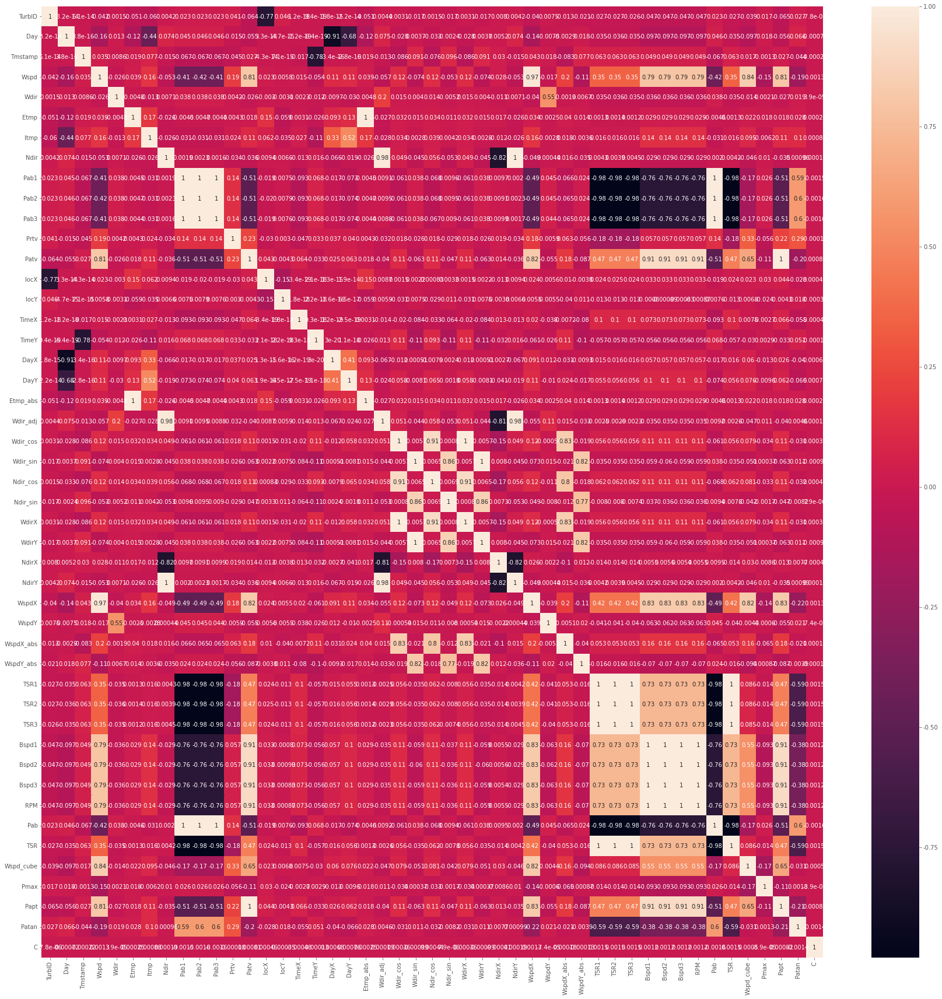

In [9]:
import seaborn as sns
import matplotlib.pyplot as plt
# %matplotlib inline
f, ax = plt.subplots(figsize=(30,30))

# plot the heatmap
sns.heatmap(corr, 
        xticklabels=corr.columns,
        yticklabels=corr.columns,annot=True)

In [39]:
temp = outlier_handler(data, ['Wspd'], 11,3)
temp = smooth(temp, 'Patv')

Day  1
      Wspd Fence High/Low (13.505/-1.6550000000000002), Count: 211
      Wspd_diff Fence High/Low (2.215/-2.2249999999999996), Count: 1722
Day  2
      Wspd Fence High/Low (19.783736888111868/-4.8395614801864415), Count: 0
      Wspd_diff Fence High/Low (1.1141579254079215/-1.1321590909090888), Count: 2956
Day  3
      Wspd Fence High/Low (15.486993006992979/4.1616783216783695), Count: 489
      Wspd_diff Fence High/Low (1.0/-1.0), Count: 2945
Day  4
      Wspd Fence High/Low (17.044999999999998/1.6450000000000005), Count: 233
      Wspd_diff Fence High/Low (1.0891841191032015/-1.1218181637696247), Count: 4793
Day  5
      Wspd Fence High/Low (18.87840107808863/-5.039040646853179), Count: 0
      Wspd_diff Fence High/Low (1.1710751748251742/-1.2051252913752897), Count: 4147
Day  6
      Wspd Fence High/Low (8.738230380730432/-1.8509382284382592), Count: 112
      Wspd_diff Fence High/Low (0.9773194768793562/-0.9794546231905555), Count: 4295
Day  7
      Wspd Fence High/Low (10.5

Day  51
      Wspd Fence High/Low (13.864493006993012/-3.5139219114218827), Count: 1116
      Wspd_diff Fence High/Low (1.2120192307692341/-1.3000320512820571), Count: 4074
Day  52
      Wspd Fence High/Low (13.906289335664317/-4.510482226107195), Count: 6
      Wspd_diff Fence High/Low (1.3091030938758208/-1.2974618563254923), Count: 4743
Day  53
      Wspd Fence High/Low (18.695489510489494/-7.665815850815826), Count: 0
      Wspd_diff Fence High/Low (1.0729254079254114/-1.0948756798756865), Count: 5419
Day  54
      Wspd Fence High/Low (14.897693910154633/-5.995380914857346), Count: 5
      Wspd_diff Fence High/Low (1.2029108391608376/-1.25818473193473), Count: 2441
Day  55
      Wspd Fence High/Low (12.01678321678322/-3.5479720279720324), Count: 48
      Wspd_diff Fence High/Low (1.1364845571095572/-1.1298907342657347), Count: 4060
Day  56
      Wspd Fence High/Low (17.181841729068097/-1.8630695484468331), Count: 2464
      Wspd_diff Fence High/Low (1.09306818181819/-1.167561188811

Day  100
      Wspd Fence High/Low (8.833564491064536/-2.356754079254101), Count: 1277
      Wspd_diff Fence High/Low (1.1212004662004595/-1.1220007770007676), Count: 3393
Day  101
      Wspd Fence High/Low (18.568715034965024/-6.867858391608372), Count: 0
      Wspd_diff Fence High/Low (1.1350796425796434/-1.1930477855477863), Count: 4287
Day  102
      Wspd Fence High/Low (19.639007958569344/-8.631404775141606), Count: 0
      Wspd_diff Fence High/Low (1.0983216783216767/-1.1910955710955695), Count: 4027
Day  103
      Wspd Fence High/Low (4.660932400932431/-0.9405594405594588), Count: 2034
      Wspd_diff Fence High/Low (1.020660450660455/-1.0603962703962733), Count: 2425
Day  104
      Wspd Fence High/Low (4.566573426573422/-0.6509557109557043), Count: 2156
      Wspd_diff Fence High/Low (0.725040792540796/-0.7230244755244777), Count: 5330
Day  105
      Wspd Fence High/Low (13.378352272727268/-4.697253787878781), Count: 270
      Wspd_diff Fence High/Low (1.072330484287216/-1.1006

Day  149
      Wspd Fence High/Low (18.695/3.374999999999999), Count: 371
      Wspd_diff Fence High/Low (1.2799999999999967/-1.2799999999999985), Count: 2557
Day  150
      Wspd Fence High/Low (16.243358585858644/2.125984848484813), Count: 90
      Wspd_diff Fence High/Low (0.9240565507561453/-0.9653882165542096), Count: 3238
Day  151
      Wspd Fence High/Low (13.537808857808916/0.0853146853146507), Count: 148
      Wspd_diff Fence High/Low (0.9100000000000004/-0.9300000000000006), Count: 2546
Day  152
      Wspd Fence High/Low (13.261223776223765/-4.262039627039607), Count: 12
      Wspd_diff Fence High/Low (0.8838728620222684/-0.9404097039920463), Count: 3858
Day  153
      Wspd Fence High/Low (11.042395104895073/-3.5683741258740964), Count: 1
      Wspd_diff Fence High/Low (0.8902258158508212/-0.8918837412587446), Count: 3162
Day  154
      Wspd Fence High/Low (8.238888888888882/-2.2495337995337814), Count: 337
      Wspd_diff Fence High/Low (0.8475524475524437/-0.8530536130536094

Day  198
      Wspd Fence High/Low (24.57835664335662/-4.13726107226103), Count: 0
      Wspd_diff Fence High/Low (1.3336786311504096/-1.280207178690247), Count: 3490
Day  199
      Wspd Fence High/Low (27.044398795648817/-11.858639277389289), Count: 0
      Wspd_diff Fence High/Low (1.0849999999999995/-1.1149999999999998), Count: 1931
Day  200
      Wspd Fence High/Low (9.60548076923078/-3.6606497668997706), Count: 1
      Wspd_diff Fence High/Low (0.5210431235431237/-0.5141550116550122), Count: 947
* Data name: Smoothing
  - Number of data: 3859200
  - Number of nan rows: 6


In [130]:
data['Pmax'] = data['Pmax'].apply(lambda x:min(x,1550))

In [119]:
data

,TurbID,Day,Tmstamp,Wspd,Wdir,Etmp,Itmp,Ndir,Pab1,Pab2,Pab3,Prtv,Patv,locX,locY,TimeX,TimeY,DayX,DayY,Etmp_abs,Wdir_adj,Wdir_cos,Wdir_sin,Ndir_cos,Ndir_sin,WdirX,WdirY,NdirX,NdirY,WspdX,WspdY,WspdX_abs,WspdY_abs,TSR1,TSR2,TSR3,Bspd1,Bspd2,Bspd3,RPM,Pab,TSR,Wspd_cube,P_max,Papt,Patan,Pmax,C
0,1,1,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3349.8515,5939.23193,1.000000,0.000000,0.999852,0.017202,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.570796,NaN,NaN
1,1,1,0.166667,6.17,-3.99,30.73,41.80,25.92,1.00,1.00,1.00,-0.25,494.66,3349.8515,5939.23193,0.999048,0.043619,0.999852,0.017202,273.88,0.382751,0.927641,0.373474,0.899405,0.437116,0.927641,0.373474,0.999969,0.007896,6.155045,-0.429323,5.723544,2.304332,1.150368,1.150368,1.150368,7.080570,7.080570,7.080570,7.080570,1.00,1.150368,233.181313,0.857621,494.660063,-0.000505,370.512087,580.996304
2,1,1,0.333333,6.27,-2.18,30.60,41.63,20.91,1.00,1.00,1.00,-0.24,509.76,3349.8515,5939.23193,0.996195,0.087156,0.999852,0.017202,273.75,0.326900,0.947042,0.321109,0.934142,0.356901,0.947042,0.321109,0.999980,0.006370,6.265462,-0.238505,5.937955,2.013353,1.150368,1.150368,1.150368,7.207590,7.207590,7.207590,7.207590,1.00,1.150368,245.957079,0.900427,509.760056,-0.000471,390.997657,567.362406
3,1,1,0.500000,6.42,-0.73,30.52,41.52,20.91,1.00,1.00,1.00,-0.26,542.53,3349.8515,5939.23193,0.991445,0.130526,0.999852,0.017202,273.67,0.352207,0.938613,0.344971,0.934142,0.356901,0.938613,0.344971,0.999980,0.006370,6.419479,-0.081794,6.025899,2.214711,1.150368,1.150368,1.150368,7.384766,7.384766,7.384766,7.384766,1.00,1.150368,264.544863,0.966892,542.530062,-0.000479,420.669569,561.243879
4,1,1,0.666667,6.25,0.89,30.49,41.38,20.91,1.00,1.00,1.00,-0.23,509.36,3349.8515,5939.23193,0.984808,0.173648,0.999852,0.017202,273.64,0.380482,0.928486,0.371368,0.934142,0.356901,0.928486,0.371368,0.999980,0.006370,6.249246,0.097080,5.803036,2.321049,1.150368,1.150368,1.150368,7.188935,7.188935,7.188935,7.188935,1.00,1.150368,244.052275,0.892196,509.360052,-0.000452,388.125553,571.112358
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3859195,134,200,23.166667,4.86,4.68,9.04,10.40,174.39,0.01,0.01,0.01,-108.13,308.65,11.3385,6713.46517,0.976296,-0.216440,-0.955642,-0.294529,252.19,3.125361,-0.999868,0.016231,-0.995210,0.097757,-0.999868,0.016231,0.998589,0.053097,4.843796,0.396530,-4.859360,0.078882,1.191331,1.191331,1.191331,5.770566,5.770566,5.770566,5.770566,0.01,1.191331,113.646913,0.455178,327.042687,-0.336971,199.728894,684.914720
3859196,134,200,23.333333,4.46,-4.00,8.79,10.33,179.76,0.01,0.01,0.01,-93.64,221.60,11.3385,6713.46517,0.984808,-0.173648,-0.955642,-0.294529,251.94,3.067591,-0.997263,0.073934,-0.999991,0.004189,-0.997263,0.073934,0.998501,0.054731,4.449136,-0.311114,-4.447793,0.329748,1.191331,1.191331,1.191331,5.300394,5.300394,5.300394,5.300394,0.01,1.191331,88.069787,0.352134,240.572254,-0.399805,154.931932,633.928001
3859197,134,200,23.500000,4.23,-0.08,8.74,10.22,172.35,0.01,0.01,0.01,-111.20,220.60,11.3385,6713.46517,0.991445,-0.130526,-0.955642,-0.294529,251.89,3.006679,-0.990913,0.134505,-0.991100,0.133121,-0.990913,0.134505,0.998622,0.052477,4.229996,-0.005906,-4.191562,0.568956,1.191331,1.191331,1.191331,5.039326,5.039326,5.039326,5.039326,0.01,1.191331,75.686746,0.300476,247.042102,-0.466906,133.174177,734.169946
3859198,134,200,23.666667,4.36,-6.12,8.64,10.10,172.35,0.01,0.01,0.01,-108.04,222.15,11.3385,6713.46517,0.996195,-0.087156,-0.955642,-0.294529,251.79,2.901261,-0.971259,0.238025,-0.991100,0.133121,-0.971259,0.238025,0.998622,0.052477,4.335151,-0.464825,-4.234689,1.037789,1.191331,1.191331,1.191331,5.164601,5.164601,5.164601,5.164601,0.01,1.191331,81.472834,0.329171,247.028873,-0.452658,143.411989,686.549687


Day  1


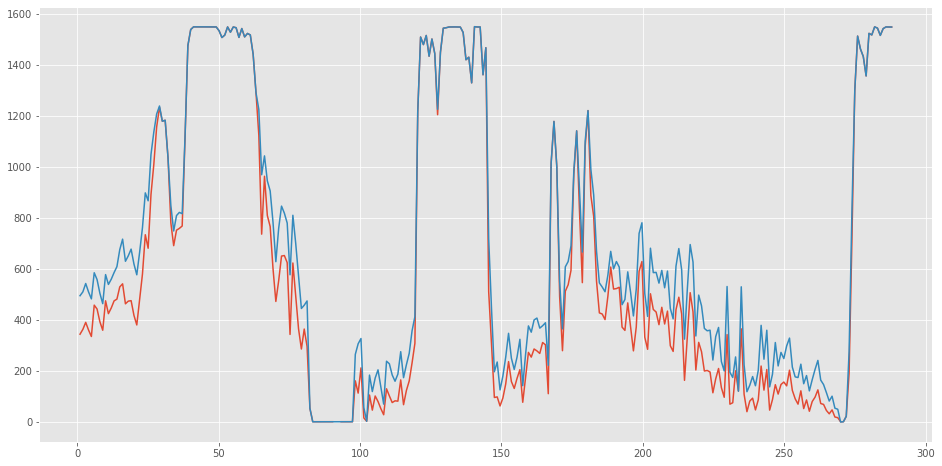

Day  2


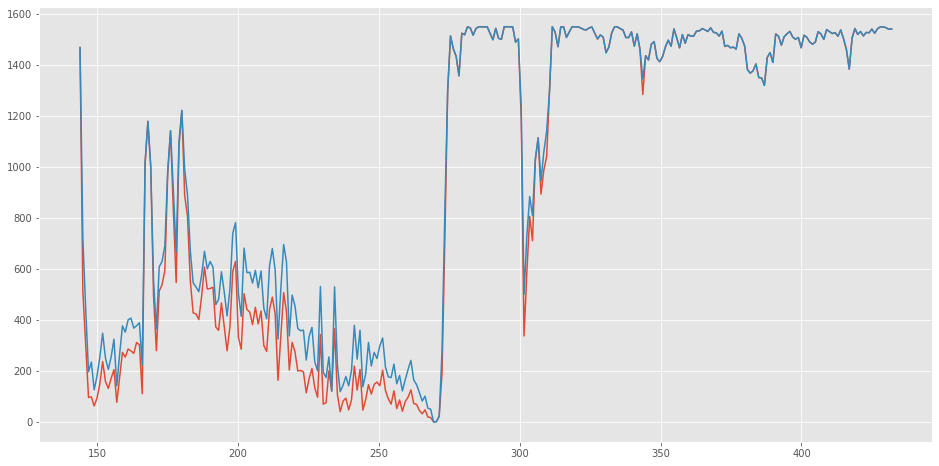

Day  3


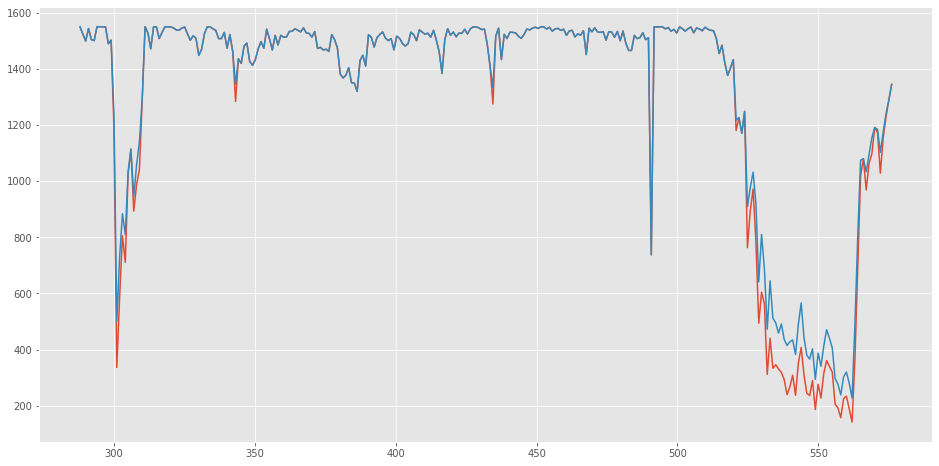

Day  4


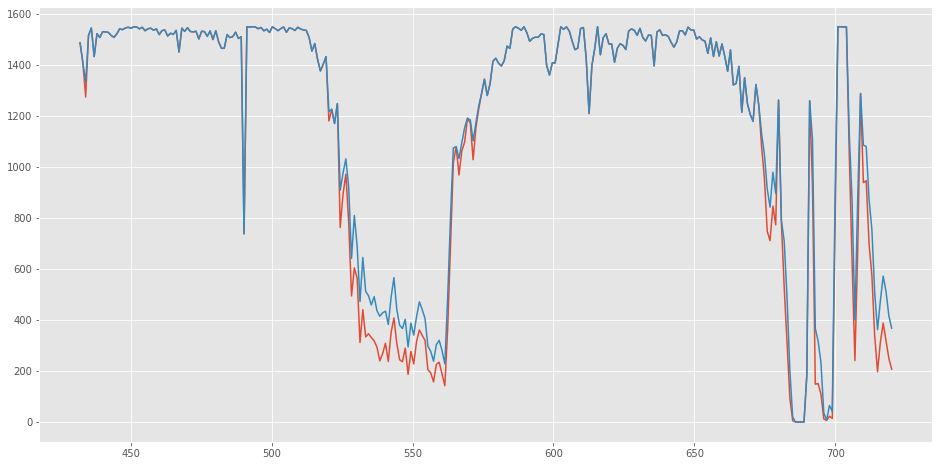

Day  5


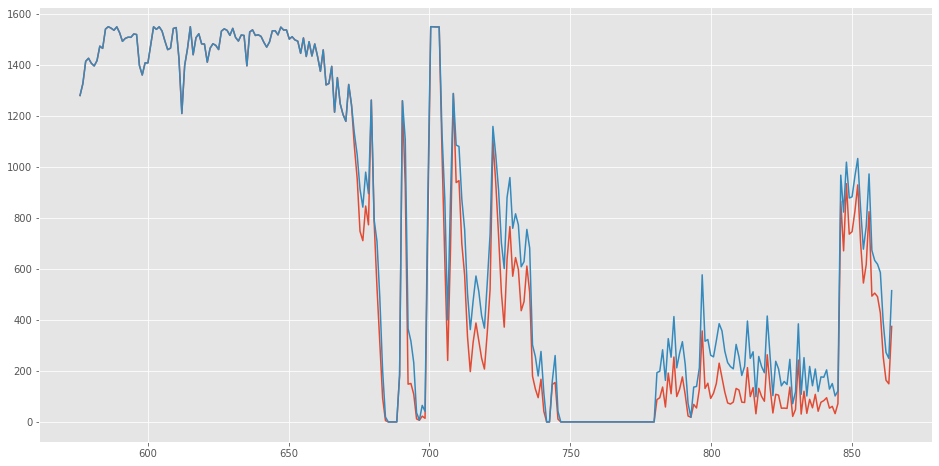

Day  6


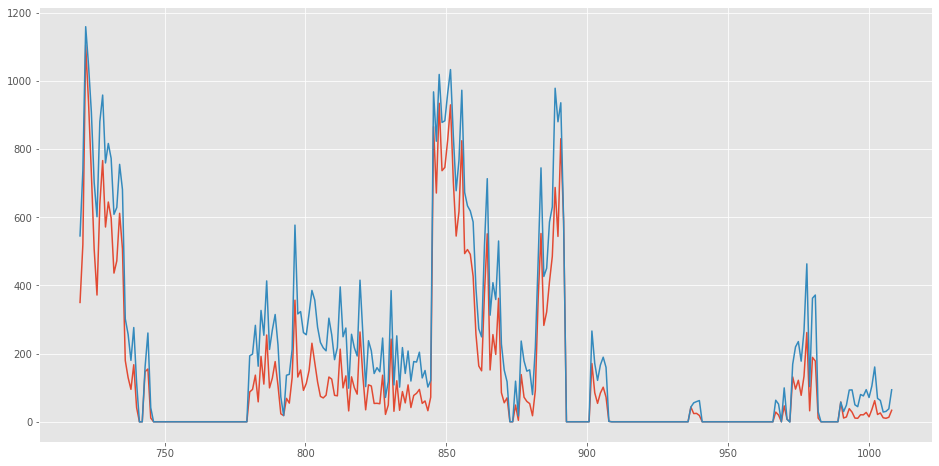

Day  7


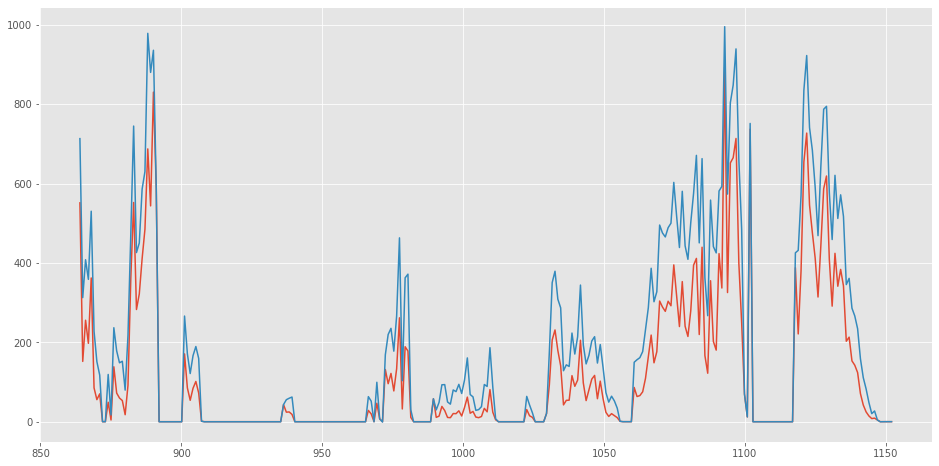

Day  8


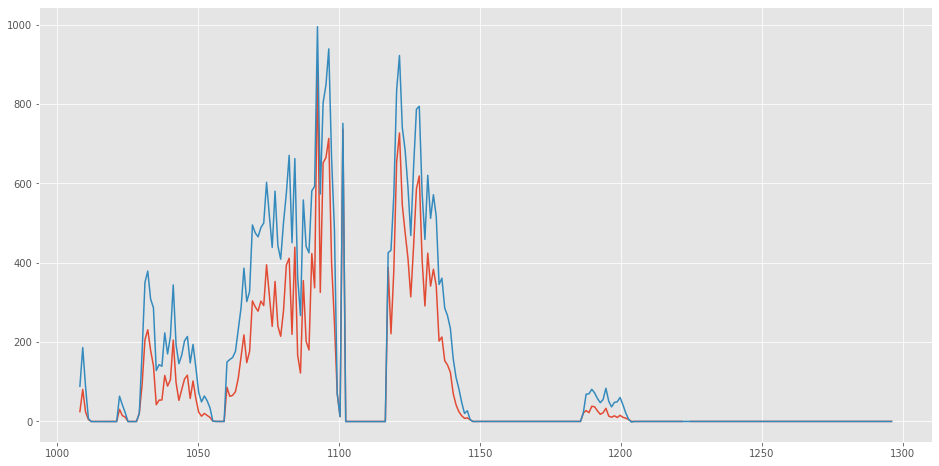

Day  9


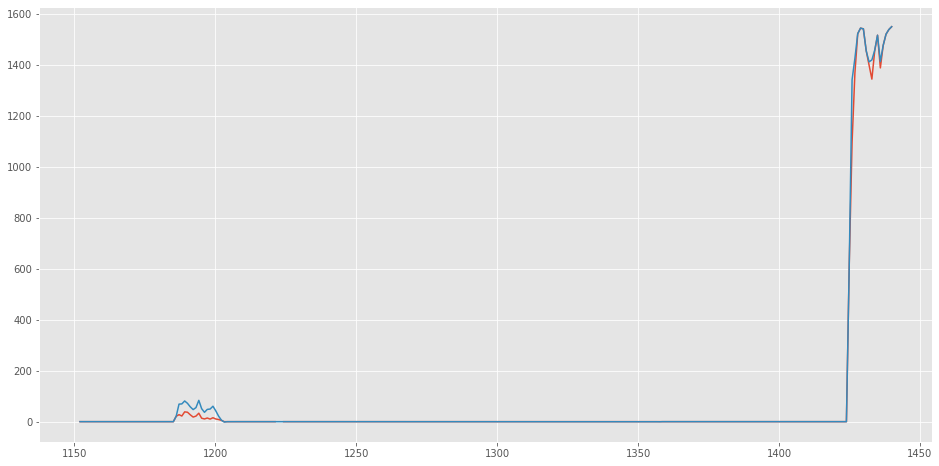

In [35]:

for i in range(1,10):
    window_size = 2
    n = 144
    columns = ['Wspd','Papt']
    temp1 = data[(data['Day'] >= i)&(data['Day'] <= i+1)].copy()
#     temp2 = temp[(temp['Day'] >= i)&(temp['Day'] <= i+1)].copy()
    print('Day ',i )
    xdata = np.linspace((i-1)*n, (i-1+window_size)*n, window_size*n)
    
    ydata = temp1['Pmax'][:window_size*n]
    plt.plot(xdata, ydata)
#     ydata = temp2['Wspd'][:window_size*n]*120
#     plt.plot(xdata, ydata)
#     ydata = temp1['Papt'][:window_size*n]
#     plt.plot(xdata, ydata)
    ydata = temp1['Patv'][:window_size*n]
    plt.plot(xdata, ydata)
    plt.show()



In [ ]:
columns = ['Patv']
data = outlier_handler2(data,columns)
for i in range(1,20):
    window_size = 2
    n = 144
    
    temp = data[(data['Day'] >= i)&(data['Day'] <= i+1)].copy()
    temp2 = train_data[(train_data['Day'] >= i)&(train_data['Day'] <= i+1)].copy()
    print('Day ',i )
    xdata = np.linspace((i-1)*n, (i-1+window_size)*n, window_size*n)
    for column in columns:
        
        ydata = temp[column][:window_size*n]
        plt.plot(xdata, ydata)
        ydata = temp2[column][:window_size*n]
        plt.plot(xdata, ydata)

    plt.show()


In [ ]:
data.loc[data['Day'] == i,:]

In [ ]:
i = 1
temp = train_data[train_data['Day'] == i]
q1 = pd.DataFrame(temp).quantile(0.25)
q3 = pd.DataFrame(temp).quantile(0.75)
iqr = q3 - q1 #Interquartile range
fence_low = q1 - (1.5*iqr)
fence_high = q3 + (1.5*iqr)
print(fence_low['Etmp'], fence_high['Etmp'])

In [ ]:
q1 = pd.DataFrame(data).quantile(0.25)
q3 = pd.DataFrame(data).quantile(0.75)
iqr = q3 - q1 #Interquartile range
fence_low = q1 - (1.5*iqr)
fence_high = q3 + (1.5*iqr)
print(iqr, fence_low, fence_high)

In [ ]:
%%time

MARKER      = -9999
IN_SEQ_LEN  = 2*144
OUT_SEQ_LEN = 2*144
STRIDE      = 144
SHUFFLE     = False
TEST_SIZE   = 0

# 1. Generate time
data_with_time = generate_full_timestamp(data)

# 2. Imputing
data_imp = impute_data(data_with_time)

# 3. Feature engineering
data_fe = feature_engineering(data_imp)

# 4. Smoothing
data_sm = smooth(data_fe, 'Patv')

# 5. Feature selection (select features)
cols = select_features(data_sm, threshold=0.2)

# 6. Split dataset
train_x, train_y, val_x, val_y, test_x = make_train_val_test_data(data_sm, IN_SEQ_LEN, OUT_SEQ_LEN, STRIDE, SHUFFLE, TEST_SIZE)

# 7. Mark anomaly
# train_y_mark = copy(train_y)
#     for i in range(len(train_y)):
#         train_y_mark[i] = marking_data(train_y_mark[i], MARKER)

# val_y_mark = copy(val_y)
#     for i in range(len(val_y)):
#         val_y_mark[i] = marking_data(val_y_mark[i], MARKER)

# 8. Feature selection (apply)
train_x = [d[cols] for d in train_x]
train_y = [d[cols] for d in train_y]
# val_x   = [d[cols] for d in val_x]
# val_y   = [d[cols] for d in val_y]
test_x  = [d[cols] for d in test_x]
# train_y_mark = [d[cols] for d in train_y_mark]
# val_y_mark   = [d[cols] for d in val_y_mark]

# 9. Scaling
train_x_norm = np.array(train_x, dtype=np.float32)
train_y_norm = np.array(train_y, dtype=np.float32)
# val_x_norm   = np.array(val_x, dtype=np.float32)
# val_y_norm   = np.array(val_y, dtype=np.float32)
test_x_norm  = np.array(test_x, dtype=np.float32)

# from sklearn.preprocessing import MinMaxScaler
# scaler = MinMaxScaler()
# train_x_norm = scaler.fit_transform(train_x_norm.reshape(-1, train_x_norm.shape[-1])).reshape(train_x_norm.shape)
# train_y_norm = scaler.fit_transform(train_y_norm.reshape(-1, train_y_norm.shape[-1])).reshape(train_y_norm.shape)
# val_x_norm   = scaler.transform(val_x_norm.reshape(-1, val_x_norm.shape[-1])).reshape(val_x_norm.shape)
# val_y_norm   = scaler.transform(val_y_norm.reshape(-1, val_y_norm.shape[-1])).reshape(val_y_norm.shape)

print("* Final data")
print("  - Train data(X, y)     :", np.shape(train_x), np.shape(train_y))
# print("  - Validation data(X, y):", np.shape(val_x),   np.shape(val_y))
print("  - Test data(X)         :", np.shape(test_x))